In [1]:
import tensorflow as tf

In [2]:
tf.__version__

'2.12.0'

In [3]:
!pip install keras

In [4]:
# import the libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.base import TransformerMixin
from sklearn.utils import resample
from gensim.models import Word2Vec
from tensorflow.keras.layers import Embedding, Conv1D, GlobalMaxPooling1D, Dense, Dropout, Flatten, MaxPooling1D, LSTM
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

In [5]:
import csv
df=pd.read_csv("fake_job_postings.csv")
df.head(5)

,job_id,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent
0,1,Marketing Intern,"US, NY, New York",Marketing,NaN,"We're Food52, and we've created a groundbreaki...","Food52, a fast-growing, James Beard Award-winn...",Experience with content management systems a m...,NaN,0,1,0,Other,Internship,NaN,NaN,Marketing,0
1,2,Customer Service - Cloud Video Production,"NZ, , Auckland",Success,NaN,"90 Seconds, the worlds Cloud Video Production ...",Organised - Focused - Vibrant - Awesome!Do you...,What we expect from you:Your key responsibilit...,What you will get from usThrough being part of...,0,1,0,Full-time,Not Applicable,NaN,Marketing and Advertising,Customer Service,0
2,3,Commissioning Machinery Assistant (CMA),"US, IA, Wever",NaN,NaN,Valor Services provides Workforce Solutions th...,"Our client, located in Houston, is actively se...",Implement pre-commissioning and commissioning ...,NaN,0,1,0,NaN,NaN,NaN,NaN,NaN,0
3,4,Account Executive - Washington DC,"US, DC, Washington",Sales,NaN,Our passion for improving quality of life thro...,THE COMPANY: ESRI – Environmental Systems Rese...,"EDUCATION: Bachelor’s or Master’s in GIS, busi...",Our culture is anything but corporate—we have ...,0,1,0,Full-time,Mid-Senior level,Bachelor's Degree,Computer Software,Sales,0
4,5,Bill Review Manager,"US, FL, Fort Worth",NaN,NaN,SpotSource Solutions LLC is a Global Human Cap...,JOB TITLE: Itemization Review ManagerLOCATION:...,QUALIFICATIONS:RN license in the State of Texa...,Full Benefits Offered,0,1,1,Full-time,Mid-Senior level,Bachelor's Degree,Hospital & Health Care,Health Care Provider,0


In [6]:
df.shape

(17880, 18)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17880 entries, 0 to 17879
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   job_id               17880 non-null  int64 
 1   title                17880 non-null  object
 2   location             17534 non-null  object
 3   department           6333 non-null   object
 4   salary_range         2868 non-null   object
 5   company_profile      14572 non-null  object
 6   description          17879 non-null  object
 7   requirements         15185 non-null  object
 8   benefits             10670 non-null  object
 9   telecommuting        17880 non-null  int64 
 10  has_company_logo     17880 non-null  int64 
 11  has_questions        17880 non-null  int64 
 12  employment_type      14409 non-null  object
 13  required_experience  10830 non-null  object
 14  required_education   9775 non-null   object
 15  industry             12977 non-null  object
 16  func

In [8]:
#check for null values
df.isna().sum()

job_id                     0
title                      0
location                 346
department             11547
salary_range           15012
company_profile         3308
description                1
requirements            2695
benefits                7210
telecommuting              0
has_company_logo           0
has_questions              0
employment_type         3471
required_experience     7050
required_education      8105
industry                4903
function                6455
fraudulent                 0
dtype: int64

In [9]:
#Removing the unwanted columns
df.drop(columns=['job_id','salary_range','department','telecommuting','has_company_logo','has_questions'],inplace=True)

In [10]:
#filling ''
df.fillna(' ',inplace=True)

In [11]:
#checking null values
df.isnull().sum()

title                  0
location               0
company_profile        0
description            0
requirements           0
benefits               0
employment_type        0
required_experience    0
required_education     0
industry               0
function               0
fraudulent             0
dtype: int64

In [12]:
df['fraudulent'].value_counts().to_frame()

,fraudulent
0,17014
1,866


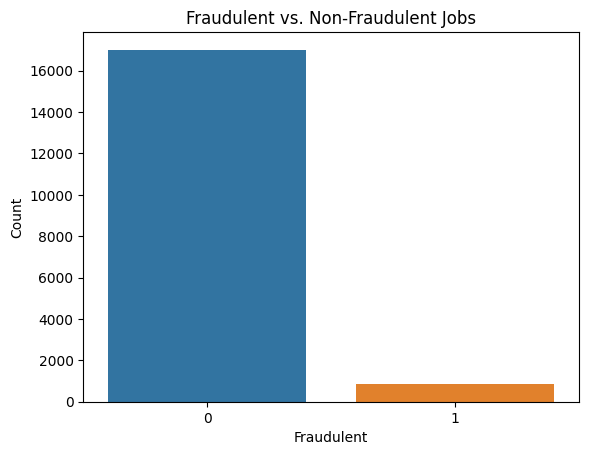

In [13]:
# Check the count of fraudulent vs non-fraudulent jobs
sb.countplot(data=df, x='fraudulent')

# Set labels and title for the plot
plt.xlabel('Fraudulent')
plt.ylabel('Count')
plt.title('Fraudulent vs. Non-Fraudulent Jobs')

# Show the plot
plt.show()

In [14]:
df['country']=df['location'].apply(lambda x:x.split(',')[0])

Text(0, 0.5, 'Number of Jobs')

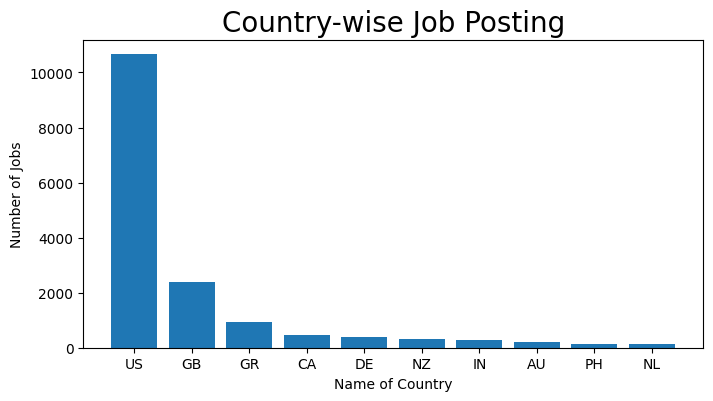

In [15]:
#visualize country-wise job posting
country =dict(df.country.value_counts()[:11])

del country[' ']
plt.figure(figsize=(8,4))

plt.title('Country-wise Job Posting',size=20)
plt.bar(country.keys(),country.values())

plt.xlabel('Name of Country')
plt.ylabel('Number of Jobs')

Text(0, 0.5, 'Number of Jobs')

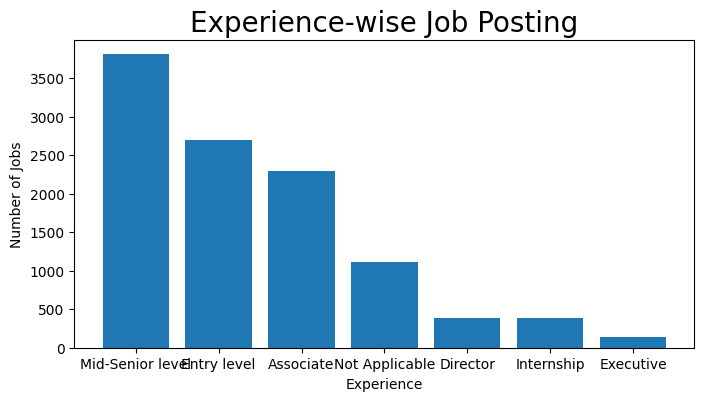

In [16]:
# Visualize Job posting by Experience

experience =dict(df.required_experience.value_counts()[:11])

del experience[' ']
plt.figure(figsize=(8,4))

plt.title('Experience-wise Job Posting',size=20)
plt.bar(experience.keys(),experience.values())

plt.xlabel('Experience')
plt.ylabel('Number of Jobs')

In [17]:

# title of jobs which are frequent.
print(df.title.value_counts()[:10])

English Teacher Abroad                                311
Customer Service Associate                            146
Graduates: English Teacher Abroad (Conversational)    144
English Teacher Abroad                                 95
Software Engineer                                      86
English Teacher Abroad (Conversational)                83
Customer Service Associate - Part Time                 76
Account Manager                                        75
Web Developer                                          66
Project Manager                                        62
Name: title, dtype: int64


In [18]:
#Fake job titles
df[df.fraudulent == 1].title.value_counts()[:11]

Data Entry Admin/Clerical Positions - Work From Home                    21
Home Based Payroll Typist/Data Entry Clerks Positions Available         21
Cruise Staff Wanted *URGENT*                                            21
Customer Service Representative                                         17
Administrative Assistant                                                16
Home Based Payroll Data Entry Clerk Position - Earn $100-$200 Daily     12
Account Sales Managers $80-$130,000/yr                                  10
Network Marketing                                                       10
Payroll Clerk                                                           10
Payroll Data Coordinator Positions - Earn $100-$200 Daily               10
Data Entry                                                               9
Name: title, dtype: int64

In [19]:
#Non-fraud job titles
df[df.fraudulent == 0].title.value_counts()[:11]

English Teacher Abroad                                311
Customer Service Associate                            146
Graduates: English Teacher Abroad (Conversational)    144
English Teacher Abroad                                 95
Software Engineer                                      86
English Teacher Abroad (Conversational)                83
Customer Service Associate - Part Time                 76
Account Manager                                        73
Web Developer                                          66
Project Manager                                        62
Beauty & Fragrance consultants needed                  60
Name: title, dtype: int64

In [20]:
df.columns

Index(['title', 'location', 'company_profile', 'description', 'requirements',
       'benefits', 'employment_type', 'required_experience',
       'required_education', 'industry', 'function', 'fraudulent', 'country'],
      dtype='object')

In [21]:
df['text'] = df['title'] + ' '+ df['location'] + ' ' + df['benefits'] + ' ' + df['company_profile'] + ' '+ df['description'] + ' ' + df['requirements'] +  ' ' + df['industry'] + ' ' + df['employment_type'] + ' ' + df['required_experience'] + ' ' + df['required_education'] + ' ' + df['function'] + ' ' + df['country']

del df['title']
del df['location']
del df['company_profile']
del df['description']
del df['requirements']
del df['benefits']
del df['employment_type']
del df['required_experience']
del df['required_education']
del df['industry']
del df['function']
del df['country']

In [22]:
df.head()

,fraudulent,text
0,0,"Marketing Intern US, NY, New York We're Food..."
1,0,"Customer Service - Cloud Video Production NZ, ..."
2,0,"Commissioning Machinery Assistant (CMA) US, IA..."
3,0,"Account Executive - Washington DC US, DC, Wash..."
4,0,"Bill Review Manager US, FL, Fort Worth Full Be..."


In [23]:
df['text']

0        Marketing Intern US, NY, New York   We're Food...
1        Customer Service - Cloud Video Production NZ, ...
2        Commissioning Machinery Assistant (CMA) US, IA...
3        Account Executive - Washington DC US, DC, Wash...
4        Bill Review Manager US, FL, Fort Worth Full Be...
                               ...                        
17875    Account Director - Distribution  CA, ON, Toron...
17876    Payroll Accountant US, PA, Philadelphia Health...
17877    Project Cost Control Staff Engineer - Cost Con...
17878    Graphic Designer NG, LA, Lagos Competitive sal...
17879    Web Application Developers NZ, N, Wellington  ...
Name: text, Length: 17880, dtype: object

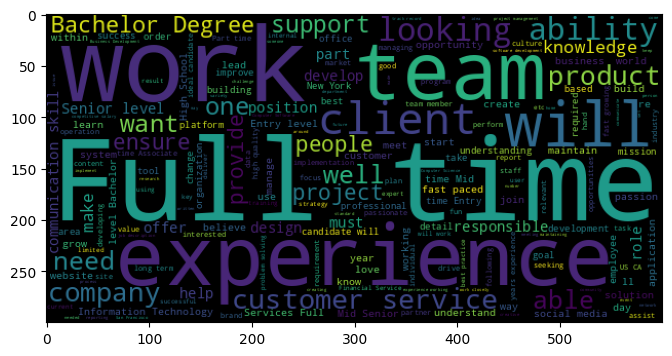

In [24]:
# Check the frequency of Word in datasets

from wordcloud import WordCloud
all_words = ' '.join([text for text in df['text']])
wordcloud = WordCloud(width = 600 ,height = 300, max_font_size = 120).generate(all_words)

plt.figure(figsize =(8,4))
plt.imshow(wordcloud)
plt.show()

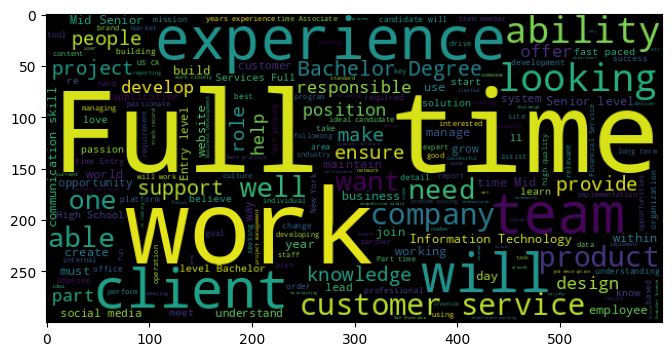

In [25]:
# frequency of word in real posting of jobs
real_post = ' '.join([text for text in df['text'][df['fraudulent']==0]])
wordcloud1 = WordCloud(width = 600 ,height = 300, max_font_size = 120).generate(real_post)
plt.figure(figsize =(8,4))
plt.imshow(wordcloud1)
plt.show()

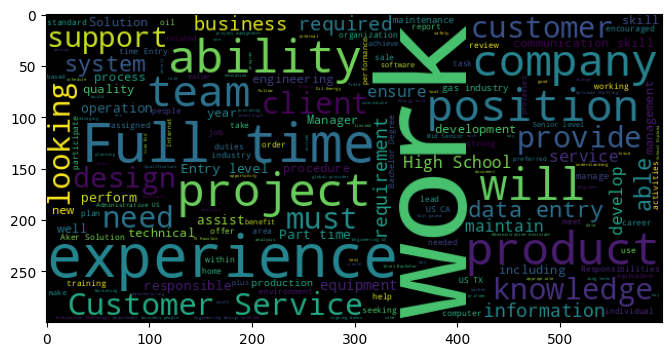

In [26]:
# frequency of word in fake posting of jobs
fake_post = ' '.join([text for text in df['text'][df['fraudulent'] == 1]])
wordcloud2 = WordCloud(width = 600 ,height = 300, max_font_size = 120).generate(fake_post)

plt.figure(figsize =(8,4))
plt.imshow(wordcloud2)
plt.show()

In [27]:
#text preprocessing
import re
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [28]:
from nltk.corpus import stopwords
print(stopwords.words("english"))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [29]:
#tokenize the sentence into words
nltk.download('punkt')
from nltk.tokenize import word_tokenize

# Create a list to store tokenized words for each sentence
tokenized_sentences = []

# Iterate over each sentence in the 'text' column of the DataFrame 'df'
for sentence in df['text']:

# Tokenize the current sentence and store the result in 'words'
    word = word_tokenize(sentence)

 # Append the list of tokenized words to the 'tokenized_sentences' list
    tokenized_sentences.append(word)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [30]:
# Lemmatize tokens and convert them to lowercase
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
nltk.download('wordnet')


lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package wordnet to /root/nltk_data...


In [31]:
corpus = []
for i in range(0, len(tokenized_sentences)):
    review = re.sub('[^a-zA-Z]', ' ', str(tokenized_sentences[i]))
    review = review.lower()
    review = review.split()

    review = [lemmatizer.lemmatize(tokenized_sentences) for tokenized_sentences in review if not tokenized_sentences in stopwords.words('english')]
    review = ' '.join(review)
    corpus.append(review)

In [32]:
corpus

['marketing intern u ny new york food created groundbreaking award winning cooking site support connect celebrate home cook give everything need one place top editorial business engineering team focused using technology find new better way connect people around specific food interest offer superb highly curated information food cooking attract talented home cook contributor country also publish well known professional like mario batali gwyneth paltrow danny meyer partnership whole food market random house food named best food website james beard foundation iacp featured new york time npr pando daily techcrunch today show located chelsea new york city food fast growing james beard award winning online food community crowd sourced curated recipe hub currently interviewing full part time unpaid intern work small team editor executive developer new york city headquarters reproducing repackaging existing food content number partner site huffington post yahoo buzzfeed various content managem

In [33]:
!pip install gensim
import gensim

In [34]:
# Preprocess the data using gensim.utils.simple_preprocess
from gensim.utils import simple_preprocess
words = [simple_preprocess(sentence) for sentence in corpus]
words

[['marketing',
  'intern',
  'ny',
  'new',
  'york',
  'food',
  'created',
  'groundbreaking',
  'award',
  'winning',
  'cooking',
  'site',
  'support',
  'connect',
  'celebrate',
  'home',
  'cook',
  'give',
  'everything',
  'need',
  'one',
  'place',
  'top',
  'editorial',
  'business',
  'engineering',
  'team',
  'focused',
  'using',
  'technology',
  'find',
  'new',
  'better',
  'way',
  'connect',
  'people',
  'around',
  'specific',
  'food',
  'interest',
  'offer',
  'superb',
  'highly',
  'curated',
  'information',
  'food',
  'cooking',
  'attract',
  'talented',
  'home',
  'cook',
  'contributor',
  'country',
  'also',
  'publish',
  'well',
  'known',
  'professional',
  'like',
  'mario',
  'batali',
  'gwyneth',
  'paltrow',
  'danny',
  'meyer',
  'partnership',
  'whole',
  'food',
  'market',
  'random',
  'house',
  'food',
  'named',
  'best',
  'food',
  'website',
  'james',
  'beard',
  'foundation',
  'iacp',
  'featured',
  'new',
  'york',
  '

 Converting Text into Vectors

In [35]:
# Lets train Word2vec
from gensim.models import Word2Vec
model = gensim.models.Word2Vec(words,window=5,min_count=2)

In [36]:
# list of words present in the model's vocabulary
model.wv.index_to_key

['experience',
 'work',
 'team',
 'service',
 'company',
 'time',
 'customer',
 'business',
 'client',
 'product',
 'skill',
 'full',
 'year',
 'new',
 'management',
 'sale',
 'technology',
 'development',
 'amp',
 'working',
 'project',
 'job',
 'level',
 'marketing',
 'design',
 'opportunity',
 'solution',
 'people',
 'ability',
 'communication',
 'high',
 'software',
 'position',
 'looking',
 'degree',
 'environment',
 'process',
 'data',
 'knowledge',
 'support',
 'help',
 'candidate',
 'url',
 'system',
 'web',
 'office',
 'including',
 'need',
 'based',
 'required',
 'provide',
 'information',
 'manager',
 'professional',
 'well',
 'application',
 'world',
 'industry',
 'quality',
 'one',
 'employee',
 'must',
 'strong',
 'technical',
 'role',
 'medium',
 'part',
 'best',
 'day',
 'make',
 'offer',
 'also',
 'great',
 'senior',
 'benefit',
 'growing',
 'training',
 'user',
 'engineering',
 'like',
 'digital',
 'within',
 'bachelor',
 'mobile',
 'get',
 'able',
 'ensure',
 'fast',

In [37]:
len(model.wv.index_to_key)

36715

In [38]:
model.vector_size

100

In [39]:
# Prepare the Input Data
X = []
for sentence in words:
    embedding = []
    for word in sentence:
        try:
            word_embedding = model.wv[word]
            embedding.append(word_embedding)
        except KeyError:
            pass

    # Convert the list of word embeddings for each sentence into a single vector using mean or sum
    sentence_embedding = sum(embedding) / len(embedding) if embedding else []  # Handle empty sentences if necessary
    X.append(sentence_embedding)

In [40]:
X

[array([-0.26967415,  0.4194918 , -0.00512274,  0.35535038, -0.21892476,
         0.36958933,  0.21210381,  0.11752775, -0.08471164, -0.00247211,
        -0.21873815, -0.0281493 , -0.49781233,  0.04562618,  0.36753315,
         0.12623814,  0.79137844, -0.35270736,  0.32726583,  0.10292836,
         0.01380046, -0.10071973,  0.37319267,  0.22207786,  0.14678432,
        -0.26222178, -0.20837653, -0.04007312, -0.16477463, -0.7390295 ,
         0.19601487, -0.631379  ,  0.22100754,  0.5533514 , -0.19812982,
        -0.4770262 , -0.24838828,  0.72527647, -0.37180394, -0.17154627,
        -0.24731857,  0.37222615,  0.32169482,  0.04927808,  0.23055398,
         0.31660986, -0.510383  ,  0.3674882 ,  0.04823706, -0.04118652,
        -0.25499716, -0.17121886, -0.01915041,  0.14682864, -0.02084187,
        -0.6298202 ,  0.00801467, -0.30472586, -0.18759221, -0.41871464,
        -0.16397496, -0.23721501, -0.41044408, -0.0872357 ,  0.03744393,
         0.0913745 ,  0.12542859, -0.17996609,  0.3

In [41]:
y = df['fraudulent']

In [42]:
# Perform padding using pad_sequences
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Define the maximum sequence length for padding.
sent_length = 100

# Perform padding on the sentence embeddings.
padded_X = pad_sequences(X, padding='pre', maxlen=sent_length, dtype='float32')

print(padded_X)

[[-0.26967415  0.4194918  -0.00512274 ...  0.89018816  0.36787066
  -0.02390319]
 [-0.28566828  0.40047613  0.14509007 ...  0.82003707  0.24309711
  -0.21997043]
 [-0.03878997  0.22186783  0.23509786 ...  0.8422707   0.01500506
   0.37738723]
 ...
 [-0.04745709  0.18929325 -0.09512962 ...  0.73343617  0.05692539
   0.25878263]
 [-0.2060873   0.4893068  -0.25544685 ...  0.20237999  0.41020566
  -0.03620796]
 [-0.53874457  0.5236083   0.08233171 ...  0.65578955  0.38801813
  -0.13755348]]


In [43]:
len(padded_X[0])

100

Model Building

In [44]:
## Creating model

# Create the Sequential model
model1=Sequential()

# Add LSTM layer with the desired number of units
model1.add(LSTM(64, input_shape=(1, 100)))

# Add Dense layer
model1.add(Dense(32, activation='relu'))

# Add Dropout layer
model1.add(Dropout(0.3))

#Add output layer
model1.add(Dense(1,activation='sigmoid'))

# Compile the model
model1.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model1.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 64)                42240     
                                                                 
 dense (Dense)               (None, 32)                2080      
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 33        
                                                                 
Total params: 44,353
Trainable params: 44,353
Non-trainable params: 0
_________________________________________________________________
None


In [45]:
import numpy as np
# Convert the lists to NumPy arrays
X_final = np.array(X)
y_final = np.array(y)

In [46]:
X_final.shape, y_final.shape

((17880, 100), (17880,))

In [47]:
# Split the Dataset into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X_final, y_final, test_size=0.25, random_state=32)

In [48]:
X_train.shape,y_train.shape, X_test.shape, y_test.shape

((13410, 100), (13410,), (4470, 100), (4470,))

In [49]:
# Reshape the input data to have three dimensions
X_train_reshaped = np.expand_dims(X_train, axis=1)
X_test_reshaped = np.expand_dims(X_test, axis=1)

In [50]:
# Define class weights
class_weights = {0: 1, 1: 18.64}

Model Training

In [51]:
#Training the model
model1.fit(X_train_reshaped, y_train, batch_size=32, epochs=10, class_weight=class_weights, validation_split=0.2)

Epoch 1/10
336/336 [==============================] - 6s 7ms/step - loss: 0.9854 - accuracy: 0.7389 - val_loss: 0.3360 - val_accuracy: 0.8654
Epoch 2/10
336/336 [==============================] - 1s 4ms/step - loss: 0.7653 - accuracy: 0.8329 - val_loss: 0.4052 - val_accuracy: 0.8195
Epoch 3/10
336/336 [==============================] - 1s 4ms/step - loss: 0.6674 - accuracy: 0.8599 - val_loss: 0.3342 - val_accuracy: 0.8669
Epoch 4/10
336/336 [==============================] - 2s 5ms/step - loss: 0.5890 - accuracy: 0.8746 - val_loss: 0.3467 - val_accuracy: 0.8617
Epoch 5/10
336/336 [==============================] - 1s 4ms/step - loss: 0.5355 - accuracy: 0.8903 - val_loss: 0.2287 - val_accuracy: 0.9124
Epoch 6/10
336/336 [==============================] - 1s 4ms/step - loss: 0.4897 - accuracy: 0.8930 - val_loss: 0.2057 - val_accuracy: 0.9277
Epoch 7/10
336/336 [==============================] - 2s 6ms/step - loss: 0.4616 - accuracy: 0.9066 - val_loss: 0.2742 - val_accuracy: 0.8915
Epoch 

Model Performance and Accuracy

In [52]:
# Make predictions
y_pred = model1.predict(X_test_reshaped)
y_pred

140/140 [==============================] - 1s 2ms/step


array([[3.0067973e-04],
       [1.4413697e-01],
       [4.1542589e-03],
       ...,
       [9.4225663e-01],
       [1.4876385e-03],
       [4.0882461e-02]], dtype=float32)

In [53]:
# Convert probabilities to binary predictions
threshold = 0.5
binary_predictions = (y_pred > threshold).astype(int).flatten()

In [54]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,binary_predictions)

array([[3976,  271],
       [  31,  192]])

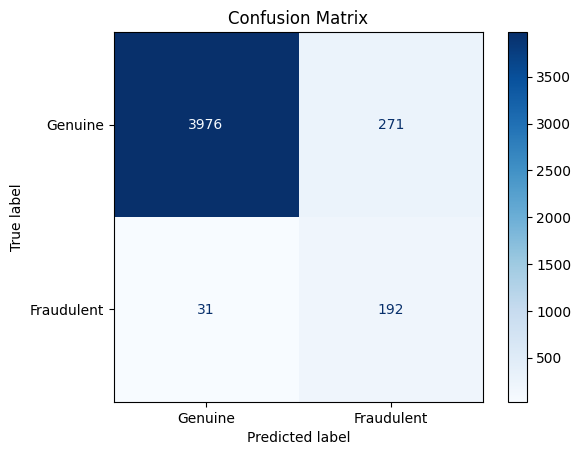

In [96]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix
confusion = confusion_matrix(y_test, binary_predictions)

# Create a ConfusionMatrixDisplay object
disp = ConfusionMatrixDisplay(confusion_matrix=confusion, display_labels=["Genuine", "Fraudulent"])

# Plot the confusion matrix
disp.plot(cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

In [97]:
# Calculate accuracy
accuracy_score(y_test,binary_predictions)
print("Accuracy  {:.3} %".format(accuracy_score(y_test, binary_predictions)*100))

Accuracy  93.2 %


In [56]:
from sklearn.metrics import classification_report
print(classification_report(y_test,binary_predictions))

              precision    recall  f1-score   support

           0       0.99      0.94      0.96      4247
           1       0.41      0.86      0.56       223

    accuracy                           0.93      4470
   macro avg       0.70      0.90      0.76      4470
weighted avg       0.96      0.93      0.94      4470



Hyperparameter tuning

In [57]:
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 3.1 MB/s eta 0:00:00


In [70]:
from keras_tuner import HyperModel
from keras import layers
from keras import models

class MyHyperModel(HyperModel):
    def build(self, hp):
        model = models.Sequential()
        model.add(layers.Dense(units=hp.Int('units',
                                            min_value=32,
                                            max_value=512,
                                            step=32),
                               activation='relu'))
        activation = hp.Choice('activation', values=['relu', 'tanh', 'sigmoid', 'elu'])
        model.add(layers.Activation(activation))
        model.compile(
            optimizer=hp.Choice('optimizer', ['adam', 'sgd', 'rmsprop']),
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy'])
        return model

In [71]:
def fit(self, X_train_reshaped, y_train, epochs, validation_split):
        model = self.build()
        history = model.fit(X_train_reshaped, y_train, epochs=epochs, validation_split=validation_split, verbose=0)
        return history.history['val_accuracy'][-1]  # Return the validation accuracy of the last epoch

In [72]:
from keras_tuner import Hyperband
tuner = Hyperband(
    hypermodel=MyHyperModel(),
    loss=['sparse_categorical_crossentropy', 'binary_crossentropy'],
    metrics=['accuracy'],
    directory='my_dir',
    project_name='my_project')

In [73]:
# Perform the hyperparameter search for a given number of epochs
tuner.search(X_train_reshaped, y_train, epochs=10, validation_split=0.2)

# Print the best hyperparameters and the corresponding accuracy
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best Hyperparameters:")
print(best_hyperparameters.values)


Search: Running Trial #1

Value             |Best Value So Far |Hyperparameter
512               |512               |units
relu              |relu              |activation
sgd               |sgd               |optimizer
2                 |2                 |tuner/epochs
0                 |0                 |tuner/initial_epoch
4                 |4                 |tuner/bracket
0                 |0                 |tuner/round

Epoch 1/2
336/336 [==============================] - 3s 6ms/step - loss: 1.9287 - accuracy: 0.9250 - val_loss: 0.6356 - val_accuracy: 0.9560
Epoch 2/2
336/336 [==============================] - 2s 6ms/step - loss: 0.6929 - accuracy: 0.7737 - val_loss: 0.4334 - val_accuracy: 0.9543


FatalTypeError: ignored

In [74]:
# Compile the model
model1.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Train the model
best_model = model1.fit(X_train_reshaped, y_train, epochs=2, validation_split=0.2)

# Evaluate the model on test data
test_accuracy = model1.evaluate(X_test_reshaped, y_test)
print("Test Accuracy: ", test_accuracy)

Epoch 1/2
336/336 [==============================] - 11s 13ms/step - loss: 0.0521 - accuracy: 0.9815 - val_loss: 0.0774 - val_accuracy: 0.9761
Epoch 2/2
140/140 [==============================] - 1s 5ms/step - loss: 0.0878 - accuracy: 0.9718
Test Accuracy:  [0.08781258016824722, 0.9718120694160461]


Display the top 3 rows of predicted text for both genuine and fraudulent

In [75]:
# Make predictions on test data
predictions = model1.predict(X_test_reshaped)

# Display Predicted Genuine
print("Predicted Genuine:")
genuine_count = 0
for i in range(len(predictions)):
    if predictions[i] < 0.5 and genuine_count < 3:  # Assuming the threshold is 0.5 for binary classification
        print(f"Sample {i+1} - Actual Label: {y_test[i]}, Prediction: {predictions[i][0]}")
        print("Text:", X_test_reshaped[i])
        print("\n")
        genuine_count += 1

print("\n")

# Display Predicted Fraudulent
print("Predicted Fraudulent:")
fraudulent_count = 0
for i in range(len(predictions)):
    if predictions[i] >= 0.5 and fraudulent_count < 3:  # Assuming the threshold is 0.5 for binary classification
        print(f"Sample {i+1} - Actual Label: {y_test[i]}, Prediction: {predictions[i][0]}")
        print("Text:", X_test_reshaped[i])
        print("\n")
        fraudulent_count += 1

140/140 [==============================] - 1s 3ms/step
Predicted Genuine:
Sample 1 - Actual Label: 0, Prediction: 1.5609663250870653e-06
Text: [[-0.54240423  0.46592382 -0.11235048  0.35871089 -0.60999185  0.2017595
   0.5316735   0.57795054  0.38285705 -0.9309574   1.1092273  -0.11803966
  -0.38709667 -0.05086986  0.04973579 -0.89109284  1.0449558   0.18704379
   0.0218216  -0.51789117 -0.23468243 -0.07872982  0.45741758  0.11451327
   0.04952092  0.11476386  0.24563195  0.37976697  0.06330534 -0.64175504
  -0.2617902   0.20226413 -0.01359354 -0.28649777 -0.4103934  -0.0154445
   0.16540582  0.9134019   0.36099073  0.752053   -0.21424595  1.0317652
   0.2647757  -0.32930934  0.69355446  0.06080111 -0.20217882 -0.00759961
  -0.00373752  0.07417156  0.21012421 -0.07873095 -0.4897382   0.16812217
  -0.63601655 -0.37392938 -0.50133616 -0.44727892  0.23450482 -0.07525422
  -0.19499628  0.08802819 -0.25982124  0.3103996  -0.03548419 -0.06865466
  -0.06792962  0.19972567  0.2852445   0.45081

Model Building2

In [76]:
## Creating model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Bidirectional as biLSTM, LSTM, Dense

# Create the Sequential model
model2=Sequential()

# Add Bidirectional LSTM layer with the desired number of units
model2.add(biLSTM(LSTM(units=128)))

# Add Dense layer
model2.add(Dense(64, activation='relu'))

# Add Dropout layer
model2.add(Dropout(0.3))

#Add output layer
model2.add(Dense(1,activation='sigmoid'))

# Compile the model
model2.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

In [85]:
# Train the BiLSTM
model2.fit(X_train_reshaped, y_train, batch_size=32, epochs=10, class_weight=class_weights, validation_split=0.2)

Epoch 1/10
336/336 [==============================] - 7s 10ms/step - loss: 0.2563 - accuracy: 0.9491 - val_loss: 0.2220 - val_accuracy: 0.9068
Epoch 2/10
336/336 [==============================] - 3s 9ms/step - loss: 0.2315 - accuracy: 0.9473 - val_loss: 0.1494 - val_accuracy: 0.9415
Epoch 3/10
336/336 [==============================] - 3s 9ms/step - loss: 0.2230 - accuracy: 0.9502 - val_loss: 0.1887 - val_accuracy: 0.9236
Epoch 4/10
336/336 [==============================] - 4s 13ms/step - loss: 0.2162 - accuracy: 0.9508 - val_loss: 0.1441 - val_accuracy: 0.9456
Epoch 5/10
336/336 [==============================] - 3s 9ms/step - loss: 0.2090 - accuracy: 0.9530 - val_loss: 0.1700 - val_accuracy: 0.9310
Epoch 6/10
336/336 [==============================] - 3s 9ms/step - loss: 0.2117 - accuracy: 0.9512 - val_loss: 0.1505 - val_accuracy: 0.9418
Epoch 7/10
336/336 [==============================] - 3s 10ms/step - loss: 0.2041 - accuracy: 0.9546 - val_loss: 0.1687 - val_accuracy: 0.9336
Epo

In [86]:
# Make predictions
pred = model2.predict(X_test_reshaped)
pred

140/140 [==============================] - 0s 3ms/step


array([[6.4488312e-08],
       [5.6022830e-02],
       [3.3015684e-05],
       ...,
       [9.8136234e-01],
       [7.8762736e-05],
       [7.3188625e-02]], dtype=float32)

In [87]:
# Convert probabilities to binary predictions
threshold = 0.5
binary_pred = (pred > threshold).astype(int).flatten()

In [88]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,binary_pred)

array([[3986,  261],
       [  28,  195]])

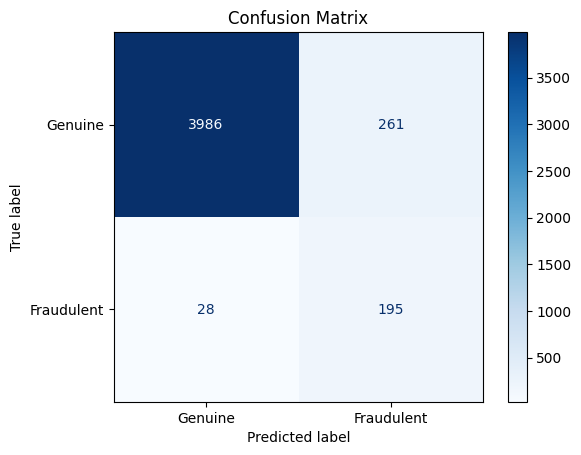

In [99]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix
confusion = confusion_matrix(y_test, binary_pred)

# Create a ConfusionMatrixDisplay object
disp = ConfusionMatrixDisplay(confusion_matrix=confusion, display_labels=["Genuine", "Fraudulent"])

# Plot the confusion matrix
disp.plot(cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

In [89]:
# Calculate accuracy
accuracy_score(y_test,binary_pred)
print("Accuracy  {:.3} %".format(accuracy_score(y_test, binary_pred)*100))

Accuracy  93.5 %


In [90]:
from sklearn.metrics import classification_report
print(classification_report(y_test,binary_pred))

              precision    recall  f1-score   support

           0       0.99      0.94      0.97      4247
           1       0.43      0.87      0.57       223

    accuracy                           0.94      4470
   macro avg       0.71      0.91      0.77      4470
weighted avg       0.96      0.94      0.95      4470



Hyperparameter Tuning

In [91]:
# Compile the best model
model2.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Train the best model
bst_model = model2.fit(X_train_reshaped, y_train, epochs=2, validation_split=0.2)

# Evaluate the model on test data
test_accuracy = model2.evaluate(X_test_reshaped, y_test)
print("Test Accuracy: ", test_accuracy)

Epoch 1/2
336/336 [==============================] - 11s 17ms/step - loss: 0.0587 - accuracy: 0.9770 - val_loss: 0.0888 - val_accuracy: 0.9713
Epoch 2/2
140/140 [==============================] - 1s 6ms/step - loss: 0.1042 - accuracy: 0.9687
Test Accuracy:  [0.10419961810112, 0.9686800837516785]


Display the top 3 rows of predicted text for both genuine and fraudulent

In [92]:
# Make predictions on test data
predictions = model2.predict(X_test_reshaped)

# Display Predicted Genuine
print("Predicted Genuine:")
genuine_count = 0
for i in range(len(predictions)):
    if predictions[i] < 0.5 and genuine_count < 3:  # Assuming the threshold is 0.5 for binary classification
        print(f"Sample {i+1} - Actual Label: {y_test[i]}, Prediction: {predictions[i][0]}")
        print("Text:", X_test_reshaped[i])
        print("\n")
        genuine_count += 1

print("\n")

# Display Predicted Fraudulent
print("Predicted Fraudulent:")
fraudulent_count = 0
for i in range(len(predictions)):
    if predictions[i] >= 0.5 and fraudulent_count < 3:  # Assuming the threshold is 0.5 for binary classification
        print(f"Sample {i+1} - Actual Label: {y_test[i]}, Prediction: {predictions[i][0]}")
        print("Text:", X_test_reshaped[i])
        print("\n")
        fraudulent_count += 1

140/140 [==============================] - 5s 9ms/step
Predicted Genuine:
Sample 1 - Actual Label: 0, Prediction: 5.2263566807653206e-09
Text: [[-0.54240423  0.46592382 -0.11235048  0.35871089 -0.60999185  0.2017595
   0.5316735   0.57795054  0.38285705 -0.9309574   1.1092273  -0.11803966
  -0.38709667 -0.05086986  0.04973579 -0.89109284  1.0449558   0.18704379
   0.0218216  -0.51789117 -0.23468243 -0.07872982  0.45741758  0.11451327
   0.04952092  0.11476386  0.24563195  0.37976697  0.06330534 -0.64175504
  -0.2617902   0.20226413 -0.01359354 -0.28649777 -0.4103934  -0.0154445
   0.16540582  0.9134019   0.36099073  0.752053   -0.21424595  1.0317652
   0.2647757  -0.32930934  0.69355446  0.06080111 -0.20217882 -0.00759961
  -0.00373752  0.07417156  0.21012421 -0.07873095 -0.4897382   0.16812217
  -0.63601655 -0.37392938 -0.50133616 -0.44727892  0.23450482 -0.07525422
  -0.19499628  0.08802819 -0.25982124  0.3103996  -0.03548419 -0.06865466
  -0.06792962  0.19972567  0.2852445   0.45081